In [1]:
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import numpy as np
import csv,nltk,re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import itertools
import sklearn

from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv('E:\\new data2019\\One_File_44000 clean.txt', sep="*")

data.columns = ["text", "class1"]
data.dropna(inplace=True)

In [3]:
data=data.groupby('class1').apply(lambda x: x.iloc[:4000])

In [4]:
df=data

In [ ]:
df.drop_duplicates( keep='first')

In [5]:
df['word_count'] = [len(t.split())for t in df.text]   #len(t) for t in df.text]

In [6]:
df.head()

text class1  word_count
class1                                                                        
ads    0   شقه تمليك شمال المحور متر غرفتبن مقفولين وريس...    ads          22
       1   شقه ايجار جديد بالبراجيل جنيه ايجار شهريا  غر...    ads          25
       2   مطلوب علي وجه السرعه (أناث - ذكور ) خبرة وبدو...    ads          24
       3   سياره للبيع   للتفاصيل من هنا    سيارات للبيع...    ads           9
       4   هيونداي النترا للايجار اليومى و اسعار خاصة لل...    ads          20

In [7]:
def normalize(text):
    text = re.sub("[ﺁإأٱآا]", "ا", text)
    text = re.sub("ى", "ي", text)
    #text = re.sub("_", " ", text)
    text = re.sub("#", " ", text)
    
    text = re.sub("ؤ", "و", text)
    #text = re.sub("ئ", "ء", text)
    text = re.sub("ة", "ه", text)
    noise = re.compile(""" ّ    | # Tashdid
                             َ    | # Fatha
                              َ~   | # Fatha
                             ً    | # Tanwin Fath
                             ُ    | # Damma
                             ٌ    | # Tanwin Damm
                             ِ    | # Kasra
                             ٍ    | # Tanwin Kasr
                             ْ    | # Sukun
                             ـ     # Tatwil/Kashida
                         """, re.VERBOSE)
    text = re.sub(noise, '', text)
    return(text)
def stopwordremoval(text):
    stop=stopwords.words("arabic - Copy")
    needed_words=[]
    words=word_tokenize(text)
    for w in words:
         if len(w)>=2 and w not in stop:
                needed_words.append(w)
    filterd_sent= " ".join(needed_words)
    return filterd_sent
def removenonarabic(text):
    n=re.sub(r'[a-zA-Z?]', '', text).strip()
    n=re.sub('\W+',' ', n )
    n=re.sub('_','', n )
    n = ''.join([i for i in n if not i.isdigit()])
    a=re.compile(u"([^\u0600-\u06ff\ufb50-\ufdff\ufe70-\ufeff\u0750-\u077f ])", re.UNICODE)
    n=re.sub(a,'', n)
    return n
def stemming(text):
    st = ISRIStemmer()
    stemmed_words=[]
    words=word_tokenize(text)
    for w in words:
        stemmed_words.append(st.stem(w))
    stemmed_sent=" ".join(stemmed_words)
    return stemmed_sent
def remove_repeating_char(text):
    return re.sub(r'(.)\1+', r'\1', text)
def preparedatasets(data):
    sentences=[]
    for index,r in data.iterrows():
        text=normalize(r['text'])
        text=stopwordremoval(text)
        text=removenonarabic(text)
        #text=stemming(text)
        sentences.append([text,r['class1']])
    df_sentence=DataFrame(sentences, columns=["text", "class1"])
    return df_sentence        

In [8]:
cleandf=preparedatasets(df)


In [9]:
cleandf['word_count'] = [len(t.split())for t in cleandf.text]   #len(t) for t in df.text]

In [10]:
Total = df['word_count'].sum()

print (Total)


976789


In [11]:
cleandf['word_count'].sum()

744225

In [37]:
data.class1.value_counts()

eco         4000
politic     4000
porno       4000
tech        4000
health      4000
sport       4000
religion    4000
tv          4000
weather     4000
ads         4000
food        4000
Name: class1, dtype: int64

In [13]:
str((data['word_count'].sum()))

'976789'

# Word Count In each class

In [14]:
#tv,Politic,tech,ads,porno,food,religion,eco,health,sports
def wordcount(df):
    result=""
    porno=df[df.class1 == 'porno']
    print ('poron tokens:', porno['word_count'].sum())
    #result+= 'poron tokens *' + str((porno['word_count'].sum()))

    tv  =df[df.class1 == 'tv']
    print ('tv tokens:',tv['word_count'].sum())

    Politic=df[df.class1 == 'politic']
    print ('Politic tokens:',Politic['word_count'].sum())

    tech=df[df.class1 == 'tech']
    print ('tech tokens:',tech['word_count'].sum())

    ads=df[df.class1 == 'ads']
    print ('ads tokens:',ads['word_count'].sum())

    food=df[df.class1 == 'food']
    print ('food tokens:',food['word_count'].sum())

    religion=df[df.class1 == 'religion']
    print ('religion tokens:',religion['word_count'].sum())

    eco=df[df.class1 == 'eco']
    print ('eco tokens:',eco['word_count'].sum())

    health=df[df.class1 == 'health']
    print ('health tokens:',health['word_count'].sum())

    sports=df[df.class1 == 'sport']
    print ('sports tokens:',sports['word_count'].sum())

    weather=df[df.class1 == 'weather']
    print ('weather tokens:',weather['word_count'].sum())
    r='class_name*Word_count\n' 
    r+='porno *'+str(porno['word_count'].sum())+'\ntv *'+str(tv['word_count'].sum())+'\n politic *'+str(Politic['word_count'].sum())+'\n tech*'+str(tech['word_count'].sum())+'\n ads*'+str(ads['word_count'].sum())+'\n food*'+str(food['word_count'].sum())+'\n relig*'+str(religion['word_count'].sum())+'\n eco*'+str(eco['word_count'].sum())+'\n health *'+str(health['word_count'].sum())+'\n sport*'+str(sports['word_count'].sum())+'\n weather*'+str(weather['word_count'].sum())
    from pandas.compat import StringIO

    nn = pd.read_csv(StringIO(r), sep='*')
    nn.plot(kind='bar',figsize=(10,8),x=nn['class_name'])
    return nn

# With Stop Words

poron tokens: 66924
tv tokens: 84210
Politic tokens: 55440
tech tokens: 68834
ads tokens: 108483
food tokens: 58880
religion tokens: 122136
eco tokens: 47121
health tokens: 162021
sports tokens: 66112
weather tokens: 136628


,class_name,Word_count
0,porno,66924
1,tv,84210
2,politic,55440
3,tech,68834
4,ads,108483
5,food,58880
6,relig,122136
7,eco,47121
8,health,162021
9,sport,66112


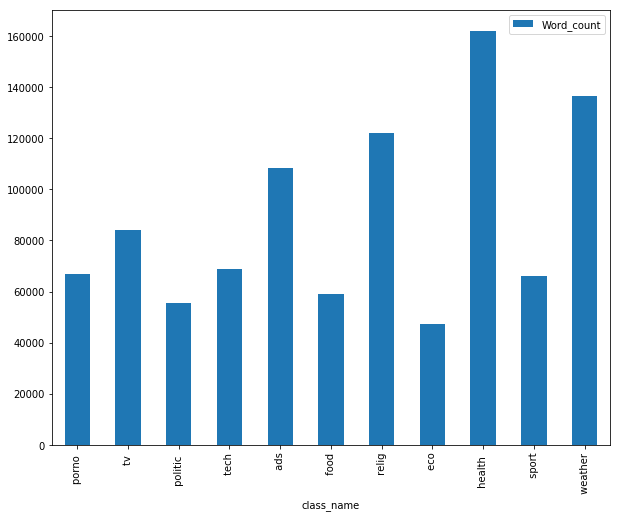

In [15]:

wordcount(df)

# Without Stop Word

poron tokens: 54287
tv tokens: 67214
Politic tokens: 45589
tech tokens: 53995
ads tokens: 80580
food tokens: 38908
religion tokens: 86638
eco tokens: 38655
health tokens: 118547
sports tokens: 53086
weather tokens: 106726


,class_name,Word_count
0,porno,54287
1,tv,67214
2,politic,45589
3,tech,53995
4,ads,80580
5,food,38908
6,relig,86638
7,eco,38655
8,health,118547
9,sport,53086


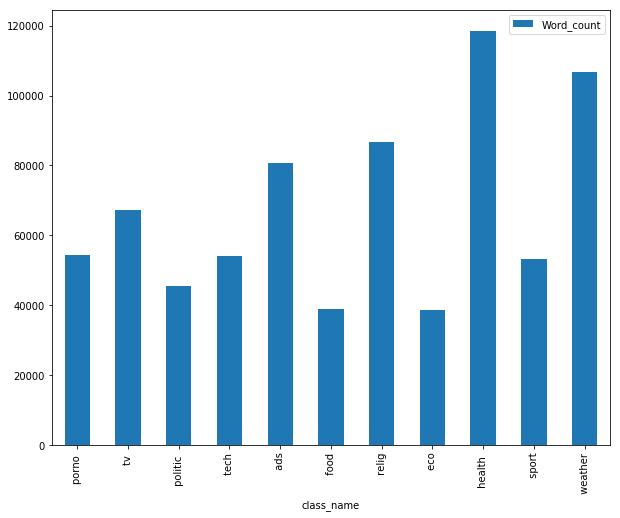

In [16]:
wordcount(cleandf)

# Unique Word Count In Each Class

In [17]:
#
def uwordcount(df):
    
    porno=df[df.class1 == 'porno']
    #result+= 'poron tokens *' + str((porno['word_count'].sum()))

    tv  =df[df.class1 == 'tv']

    Politic=df[df.class1 == 'politic']

    tech=df[df.class1 == 'tech']

    ads=df[df.class1 == 'ads']

    food=df[df.class1 == 'food']

    religion=df[df.class1 == 'religion']

    eco=df[df.class1 == 'eco']

    health=df[df.class1 == 'health']

    sports=df[df.class1 == 'sport']

    weather=df[df.class1 == 'weather']
    
    
    
    tv1=[]
    Politic1=[]
    tech1=[]
    ads1=[]
    porno1=[]
    food1=[]
    religion1=[]
    eco1=[]
    health1=[]
    sports1=[]
    weather1=[]


    for t in porno.text:
        porno1.append(t) 

    for t1 in tv.text:
        tv1.append(t1) 
        #len(t) for t in df.text]p = []
    for t2 in Politic.text:
        Politic1.append(t2) 
        #len(t) for t in df.text]p = []
    for t3 in tech.text:
        tech1.append(t3) 
        #len(t) for t in df.text]p = []
    for t4 in ads.text:
        ads1.append(t4) 
        #len(t) for t in df.text]p = []
    for t5 in food.text:
        food1.append(t5) 
        #len(t) for t in df.text]p = []
    for t6 in religion.text:
        religion1.append(t6) 
        #len(t) for t in df.text]p = []
    for t7 in eco.text:
        eco1.append(t7) 
        #len(t) for t in df.text]p = []
    for t8 in health.text:
        health1.append(t8) 
        #len(t) for t in df.text]p = []
    for t9 in sports.text:
        sports1.append(t9) 
    for t10 in weather.text:
        weather1.append(t10) 
        #len(t) for t in df.text]
        #len(t) for t in df.text]
        c1=' '.join(porno1)
    c2=' '.join(tv1)
    c3=' '.join(Politic1)
    c4=' '.join(tech1)
    c5=' '.join(ads1)
    c6=' '.join(food1)
    c7=' '.join(religion1)
    c8=' '.join(eco1)
    c9=' '.join(health1)
    c10=' '.join(sports1)
    c11=' '.join(weather1)
    print('porno unique words ',len(set(c1.split())))
    print('tv unique words ',len(set(c2.split())))
    print('Politic unique words ',len(set(c3.split())))
    print('tech unique words ',len(set(c4.split())))
    print('ads unique words ',len(set(c5.split())))
    print('food unique words ',len(set(c6.split())))
    print('religion unique words ',len(set(c7.split())))
    print('eco unique words ',len(set(c8.split())))
    print('health unique words ',len(set(c9.split())))
    print('sports unique words ',len(set(c10.split())))
    rr='class_name*Unique_Word_count\n' 
    rr+='porno *'+str(len(set(c1.split())))+'\ntv *'+str(len(set(c2.split())))+'\n politic *'+str(len(set(c3.split())))+'\n tech*'+str(len(set(c4.split())))+'\n ads*'+str(len(set(c5.split())))+'\n food*'+str(len(set(c6.split())))+'\n relig*'+str(len(set(c7.split())))+'\n eco*'+str(len(set(c8.split())))+'\n health *'+str(len(set(c9.split())))+'\n sport*'+str(len(set(c10.split())))+'\n weather*'+str(len(set(c11.split())))
    from pandas.compat import StringIO

    n2 = pd.read_csv(StringIO(rr), sep='*')
    n2
    ax=n2.plot( kind='bar',figsize=(12,10), x=n2['class_name'])
    return n2

# With stop words

porno unique words  13276
tv unique words  17009
Politic unique words  17317
tech unique words  16272
ads unique words  16274
food unique words  10188
religion unique words  25838
eco unique words  11531
health unique words  30305
sports unique words  13515


,class_name,Unique_Word_count
0,porno,13276
1,tv,17009
2,politic,17317
3,tech,16272
4,ads,16274
5,food,10188
6,relig,25838
7,eco,11531
8,health,30305
9,sport,13515


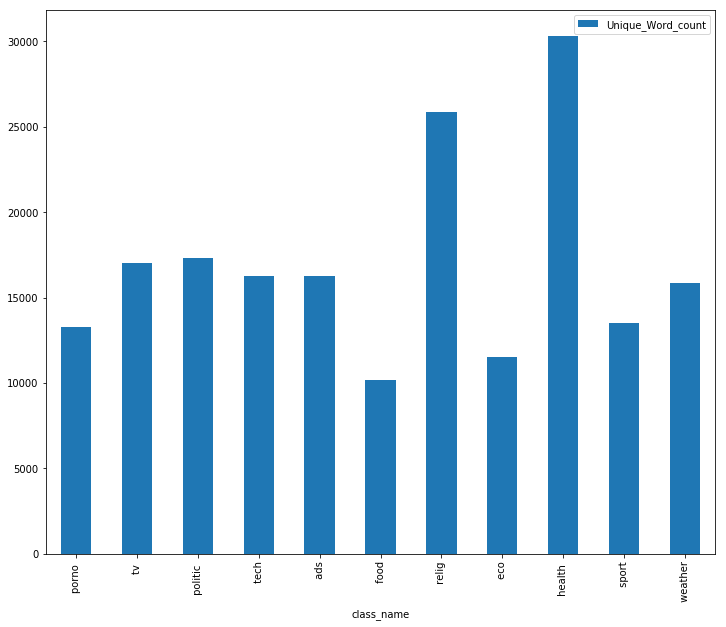

In [18]:
uwordcount(df)

In [20]:
Withou stop words

porno unique words  9254
tv unique words  11657
Politic unique words  13744
tech unique words  12779
ads unique words  11153
food unique words  7174
religion unique words  17005
eco unique words  9267
health unique words  21257
sports unique words  9934


,class_name,Unique_Word_count
0,porno,9254
1,tv,11657
2,politic,13744
3,tech,12779
4,ads,11153
5,food,7174
6,relig,17005
7,eco,9267
8,health,21257
9,sport,9934


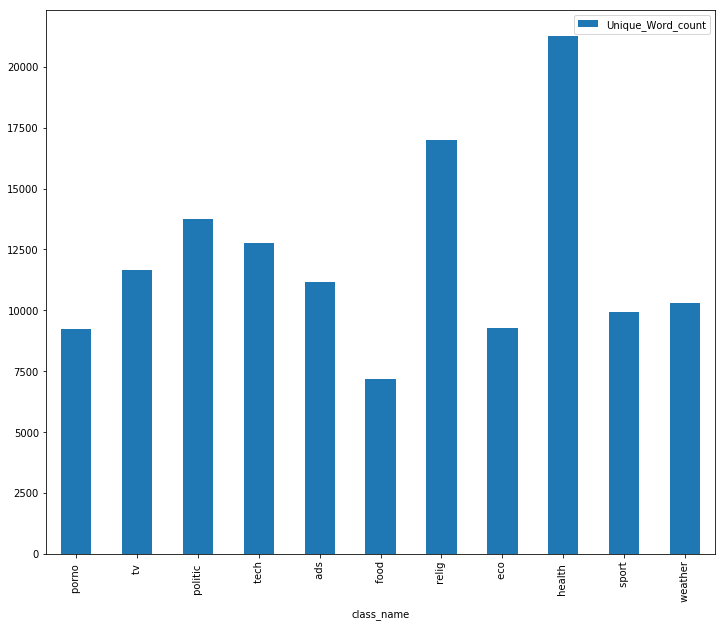

In [19]:
uwordcount(cleandf)

# Word Frequncy

In [20]:
from sklearn.feature_extraction.text import CountVectorizer

def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [21]:
from sklearn.feature_extraction.text import CountVectorizer
import cufflinks as cf

cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)



import matplotlib
import plotly.graph_objs as go
from plotly.offline import iplot
common_words = get_top_n_words(df['text'], 1000)
for word, freq in common_words:
    print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['text' , 'count'])
df1.groupby('text').sum()['count'].sort_values(ascending=False).iplot(
kind='bar', yTitle='Count', linecolor='black', title='Top 1000 words in review before removing stop words')

من 24488
في 18993
على 16846
مع 5789
عن 3943
http 3648
اللهم 3328
الله 3160
علي 3101
ly 3020
إلى 2997
أن 2896
لا 2887
بعد 2866
ما 2864
bit 2770
سكس 2715
فى 2710
كل 2529
يا 2381
أو 2367
https 2271
مصر 2162
فيلم 1931
نيك 1886
خلال 1788
التي 1774
او 1749
اليوم 1659
com 1578
هذا 1565
قد 1564
شمال 1524
الساعة 1477
يوم 1381
الان 1342
الى 1248
ولا 1224
هنا 1208
بطولة 1198
هو 1190
المناطق 1174
بين 1160
الصعيد 1132
بعض 1131
عند 1128
بشكل 1104
الذي 1101
حتى 1095
ان 1091
محمد 1086
جنيه 1076
قبل 1057
تقنية 1039
فقط 1034
هذه 965
القاهرة 951
هل 946
هي 942
الشمالية 941
البلاد 934
مساء 928
طريقة 923
كما 914
جديد 905
اللي 890
قليل 882
السواحل 879
إن 860
الحرارة 858
إلا 838
cbc 832
تكون 822
مقادير 821
الدلتا 820
خاص 816
مناطق 799
لي 793
عليه 787
الزمالك 786
عمل 780
أحمد 750
أندرويد 739
غير 726
شاشة 725
تعرف 719
جنوب 716
لو 714
طقس 712
ومن 711
كورابيا 710
كان 708
جدا 706
السحب 691
حيث 683
جديدة 681
عروض 679
عبر 678
أكثر 670
له 668
مطلوب 667
عبد 663
أي 658
انتظرونا 654
يكون 652
الي 651
ده 649
جوميا 643
دول

عايزه 142
لمتابعة 142
إمام 142
اغفر 142
الشريف 142
بخصومات 141
نصر 141
الاحمر 141
تعرض 141
شوربة 141
الأمر 141
إنا 141
المعلومات 140
ميلاد 140
الفترة 140
لشركة 140
عالية 140
وصول 140
منهم 140
الرحمن 140
الدولار 140
التالية 139
قريبا 139
تقل 139
ضعف 139
الهواتف 139
للسحب 139
القناة 139
الشيف 139
تحذير 139
جنوبا 139
الطرق 138
الأخيرة 138
يسجل 138
بشأن 138
وإن 138
الأم 137
مجال 137
الجو 137
العالمي 137
القدم 137
المتوسطة 137
أمراض 137
فلا 137
الذنوب 137
اختار 136
الشحن 136
أقوى 136
أولى 136
حدوث 136
السعودي 136
skynewsarabia 136
عني 136
تبعت 136
أسرع 135
شباب 135
العامة 135
الإعلان 135
رسمي 135
زورونا 135
جد 135
بكرة 134
تشكيل 134
حلو 134
سمير 134
2018 134
اجواء 134
2013 134
الشمالي 133
مناسب 133
الطفل 133
بوصة 133
فوري 133
الرأس 133
يحتوي 133
عادة 133
شقه 132
سوبر 132
ظهرا 132
مشروع 132
المسلسل 132
يمكنك 132
عدة 132
ربي 132
تلك 132
ملحوظ 132
تؤدي 132
اول 131
مراكز 131
أحلى 131
عنها 131
حركة 131
يعرض 131
نظام 130
سيتي 130
01028616161 130
اله 130
بزازها 130
قدير 130
الف 129
جامد 129
إلي 12

In [22]:
common_words2 = get_top_n_words(cleandf['text'], 1000)
for word, freq in common_words2:
    print(word, freq)
df3 = pd.DataFrame(common_words2, columns = ['text' , 'count'])
df3.groupby('text').sum()['count'].sort_values(ascending=False).iplot(
kind='bar', yTitle='Count', linecolor='black', title='Top 1000 words in review after removing stop words')

اللهم 3633
الله 3123
سكس 2718
مصر 2166
فيلم 1930
نيك 1886
خلال 1788
اليوم 1662
جنيه 1559
الساعه 1527
شمال 1503
يوم 1368
الشماليه 1321
بطوله 1199
الحراره 1190
المناطق 1174
الصعيد 1133
القاهره 1115
بشكل 1104
محمد 1094
قبل 1046
تقنيه 1040
فقط 1034
الامطار 966
جديد 961
طريقه 949
البلاد 934
مساء 932
افلام 924
قليل 879
السواحل 879
احمد 855
جدا 826
تكون 826
مقادير 821
الدلتا 820
مناطق 799
خاص 796
الزمالك 789
اندرويد 783
عمل 783
الاهلي 740
تعرف 735
شاشه 731
جديده 719
طقس 714
كورابيا 712
اكتر 696
غدا 693
السحب 692
امطار 684
عروض 683
عبر 679
مطلوب 674
جنوب 673
ده 671
انتظرونا 659
افضل 658
عبد 657
يكون 655
قال 653
امام 647
شركه 645
جوميا 644
دولار 639
اشتري 636
المصري 620
للبيع 619
رب 606
الرياح 595
حاله 585
اول 581
يمكن 580
الاول 572
دلوقتي 563
اللينك 562
الاسبوع 560
مش 558
سامسونج 556
وسط 556
تصل 554
بسبب 554
برنامج 535
ليلا 534
رابط 533
مباشره 532
الطقس 532
متر 531
ايضا 528
الدوري 528
كسها 528
مليون 523
اخر 521
بديل 518
بدايه 514
عاجل 511
لحد 505
الجمعه 503
فرص 502
غرب 497
حول 493
ايام 492
الا

بزازها 130
بنات 129
ارباح 129
جامد 129
ابراهيم 129
الاقل 129
السودان 129
تويتر 129
وتكون 129
الفم 129
ليفربول 129
روتانا 129
تماما 128
مصريه 128
اكتشف 128
البيع 128
تقوم 128
الامن 128
النادي 128
فما 128
بكافه 128
تخفيف 128
المائيه 128
الشمال 128
تسبب 128
الظهر 127
الاسعار 127
عاما 127
صوت 127
تعاني 127
المسلمين 127
الشعور 127
تجنب 127
مواجهه 127
شات 127
لعلاج 127
الغزيره 127
العاصفه 127
برجاء 126
الشتاء 126
كميه 126
يعلن 126
الامارات 126
يقوم 126
وضع 126
روسيا 126
طويله 126
الطبيعيه 126
الشاي 126
الوضع 126
نقص 126
الممحونه 126
حلمي 126
مانشستر 126
مختلف 125
هطول 125
بسم 125
تساقط 125
يونايتد 125
بفضلك 125
المنتج 124
اعرف 124
ثلاث 124
عز 124
السيارات 124
تدخل 124
هيلز 124
نسبيا 124
رضي 124
سواحلنا 124
للتفاصيل 123
موهل 123
الاجهزه 123
ربع 123
بدء 123
قوي 123
حديث 123
لذلك 123
حاره 123
لبعض 123
ابرز 123
كواليس 123
البخاري 123
موبايل 122
الانترنت 122
حل 122
السنه 122
تتمتع 122
مني 122
دراسه 122
النشره 122
الرجال 121
الخامس 121
دائما 121
الفني 121
لانه 121
بقوه 121
سهله 121
دول 121
اطلاق 1

In [23]:
d=[]
for index,r in df.iterrows():
        d.append((r['text']))

In [24]:
d2=[]
for index,r in cleandf.iterrows():
        d2.append((r['text']))

In [25]:
def char_frequency(str1):
    dict = {}
    for n in str1:
        keys = dict.keys()
        if n in keys:
            dict[n] += 1
        else:
            dict[n] = 1
    return dict
x=(char_frequency(str(d)))
x1=(char_frequency(str(d2)))

# Char frequncy with stopwords

In [26]:

x

{' ': 1167564,
 '!': 2098,
 '"': 14826,
 '#': 12758,
 '$': 18,
 '%': 8335,
 '&': 98,
 "'": 87969,
 '(': 2275,
 ')': 2567,
 '*': 23,
 '+': 571,
 ',': 46528,
 '-': 11257,
 '.': 49283,
 '/': 22904,
 '0': 6174,
 '1': 6407,
 '2': 7126,
 '3': 3106,
 '4': 2249,
 '5': 2514,
 '6': 3157,
 '7': 2223,
 '8': 2876,
 '9': 2573,
 ':': 15408,
 ';': 98,
 '<': 44,
 '=': 801,
 '>': 108,
 '?': 334,
 '@': 918,
 'A': 1456,
 'B': 1215,
 'C': 1676,
 'D': 1409,
 'E': 1443,
 'F': 587,
 'G': 736,
 'H': 685,
 'I': 628,
 'J': 462,
 'K': 472,
 'L': 696,
 'M': 834,
 'N': 1337,
 'O': 1105,
 'P': 867,
 'Q': 555,
 'R': 863,
 'S': 1648,
 'T': 1216,
 'U': 615,
 'V': 711,
 'W': 652,
 'X': 916,
 'Y': 493,
 'Z': 453,
 '[': 45,
 '\\': 6631,
 ']': 45,
 '^': 14,
 '_': 6338,
 '`': 6,
 'a': 8536,
 'b': 5972,
 'c': 4791,
 'd': 5953,
 'e': 7577,
 'f': 2287,
 'g': 2866,
 'h': 7785,
 'i': 8370,
 'j': 651,
 'k': 1365,
 'l': 6271,
 'm': 4075,
 'n': 3152,
 'o': 7237,
 'p': 7395,
 'q': 652,
 'r': 3737,
 's': 7163,
 't': 25688,
 'u': 2249

# Char frequncy without stopwords

In [27]:
x1

{' ': 761302,
 "'": 88000,
 ',': 43999,
 '[': 1,
 ']': 1,
 'ء': 15013,
 'ئ': 13240,
 'ا': 674488,
 'ب': 160174,
 'ت': 188432,
 'ث': 13827,
 'ج': 69143,
 'ح': 78533,
 'خ': 37882,
 'د': 125379,
 'ذ': 10340,
 'ر': 217877,
 'ز': 30686,
 'س': 115993,
 'ش': 54819,
 'ص': 49494,
 'ض': 27029,
 'ط': 50827,
 'ظ': 9617,
 'ع': 113647,
 'غ': 16601,
 'ف': 84830,
 'ق': 83714,
 'ك': 88925,
 'ل': 441294,
 'م': 234154,
 'ن': 162207,
 'ه': 219741,
 'و': 221956,
 'ي': 296935,
 'ڤ': 12,
 'ک': 6,
 'گ': 17,
 'ھ': 8,
 'ہ': 20,
 'ۆ': 3,
 'ۈ': 2,
 'ی': 31,
 'ﷺ': 48,
 'ﺀ': 7,
 'ﺃ': 12,
 'ﺄ': 2,
 'ﺆ': 3,
 'ﺇ': 7,
 'ﺈ': 5,
 'ﺋ': 5,
 'ﺍ': 195,
 'ﺎ': 171,
 'ﺏ': 6,
 'ﺐ': 10,
 'ﺑ': 78,
 'ﺒ': 30,
 'ﺓ': 13,
 'ﺔ': 35,
 'ﺕ': 11,
 'ﺖ': 18,
 'ﺗ': 51,
 'ﺘ': 81,
 'ﺚ': 2,
 'ﺛ': 1,
 'ﺜ': 6,
 'ﺝ': 6,
 'ﺟ': 18,
 'ﺠ': 24,
 'ﺢ': 2,
 'ﺣ': 38,
 'ﺤ': 38,
 'ﺦ': 1,
 'ﺧ': 8,
 'ﺨ': 10,
 'ﺩ': 22,
 'ﺪ': 62,
 'ﺫ': 1,
 'ﺬ': 2,
 'ﺭ': 28,
 'ﺮ': 75,
 'ﺯ': 7,
 'ﺰ': 12,
 'ﺱ': 2,
 'ﺲ': 24,
 'ﺳ': 30,
 'ﺴ': 27,
 'ﺵ': 1,
 'ﺶ': 10,
 'ﺷ': 11,
 'ﺸ': 17,
 

text   class1  \
class1                                                                      
ads     0       شقه تمليك شمال المحور متر غرفتبن مقفولين وريس...      ads   
        1       شقه ايجار جديد بالبراجيل جنيه ايجار شهريا  غر...      ads   
        2       مطلوب علي وجه السرعه (أناث - ذكور ) خبرة وبدو...      ads   
        3       سياره للبيع   للتفاصيل من هنا    سيارات للبيع...      ads   
        4       هيونداي النترا للايجار اليومى و اسعار خاصة لل...      ads   
        5       للبيع بنيلى كافي نيرو سبورت موديل للبيع   للت...      ads   
        6       مطلوب مسؤولين مبيعات بنات للعمل  للتفاصيل من ...      ads   
        7       مطلوب مهندسين وفنيين تيار خفيف   للتفاصيل من ...      ads   
        8       شقة رائعة فيو نادى سبورتنج م  للتفاصيل من هنا...      ads   
        9       فيلا بالحديقة بارقي قري الساحل الشمالي عالبحر...      ads   
        10      محل متر اول استخدام علي المحارة ارتفاع متر  ل...      ads   
        11      مطلوب مساعدين الوميتال للعمل   للتفاصيل من هن...      ads   
        12      شقة م مميزة جداً بحرية تماما بالتجمع الثالث  ...      ads   
        13      مطلوب افراد امن وبنوك بس يكون جيد الطول وراتب...      ads   
        14      شقه بسيدي بشر موقع مميز جدا تصلح لجميع الانشط...      ads   
        15      شقه للبيع بارقى موقع بالمهندسين   للتفاصيل من...      ads   
        16      فيلا بالرحاب مستقله موقع متميز و تشطيبات خاصه...      ads   
        17      فيلا بجوار البحيرة للبيع في مارينا الساحل الش...      ads   
        18      عروض ومفاجأت عيد ميلاد جوميا بدأت على الأزياء...      ads   
        19      عروض ومفاجأت عيد ميلاد جوميا بدأت على الأزياء...      ads   
        20      عروض ومفاجأت عيد ميلاد جوميا بدأت على منتجات ...      ads   
        21      يعنى ايه ؟  ادخل واعرف كل عروض الو مواعيدها ⬅...      ads   
        22      مطلوب  مهندسي مبيعات ( كهرباء او ميكانيكا او ...      ads   
        23      خليك متابعنا عشان تلحق عروض الـ في عيد ميلاد ...      ads   
        24      عروض عيد ميلاد جوميا بدأت الحق اشتري موبايل ب...      ads   
        25      عروض عيد ميلاد جوميا بدأت  اشتري اجود التيشير...      ads   
        26      عـروض ومــفاجأت عيد مــيلاد جوميا بـــدأت  يا...      ads   
        27      عـروض ومــفاجأت عيد مــيلاد جوميا بـــدأت  يا...      ads   
        28      اعرف اجندة الاحتفال بعيد ميلاد جوميا الخامس  ...      ads   
        29      باقي أيام و نبدأ الاحتفال بعيد ميلاد جوميا ال...      ads   
...                                                          ...      ...   
weather 43308  وكأنها حالة صيف.. سبب محدودية الاضطراب الجوي ا...  weather   
        43309  تساقط البَرَدالان بأحجام  كبيرة في مدينة #الغر...  weather   
        43310  #طقس_العالم من امطار الخير  على الغردقه /مصر  ...  weather   
        43311  تأكيدا لتحذيرات #الارصاد..امطار و رعد بمدينة #...  weather   
        43312  #تبوك  سحابه سوبر سل التي ظهرت الساعة ١١:٤٥ في...  weather   
        43313  دلوقتى احنا فى طقس  شغل المروحه حران اطفى المر...  weather   
        43314  قريبا سؤال الترجمة ثانوية عامة لقد شهدت مصر اس...  weather   
        43315  طقس رائع في #الاسكندرية الان بعد يومين من الطق...  weather   
        43316                       يتميز طقس مصر بالشيزوفرينيا   weather   
        43317  الوضع مشروح كما يظهر على صور الاقمار الصناعية ...  weather   
        43318  #مصر قبل قليل وعاصفة رملية قوية بسبب السحب الر...  weather   
        43319  سحب ( متوسطة وعالية ) فوق مصر في طريقها لاجواء...  weather   
        43320  طقس اليوم معتدل نهاراً بارد ليلاً.. والعظمى في...  weather   
        43321  #الأرصاد : طقس اليوم شديد البرودة و #أمطار غزي...  weather   
        43322           #بردية_العريش_مصر امس منقول #طقس_العالم   weather   
        43323  «أ.ح.ا» تعليق مستخدمي السوشيال ميديا على تحذير...  weather   
        43324  #اليوم_السابع | #مصر | طقس غير مستقر على جميع ...  weather   
        43325  #لليوم_السابع | #مصر | #حالة_الطقس| الأرصاد: ط...  weather   
        43326  منخفض المتوسط واضح النشاط فيه  على سواحل ليبيا...  weather   
        43327  #مصر | #الأرصاد: طقس الغد شديد البرودة لي

# Word Cloud

In [28]:
from bidi.algorithm import get_display
import os
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import arabic_reshaper

# Word Cloud for the dataset

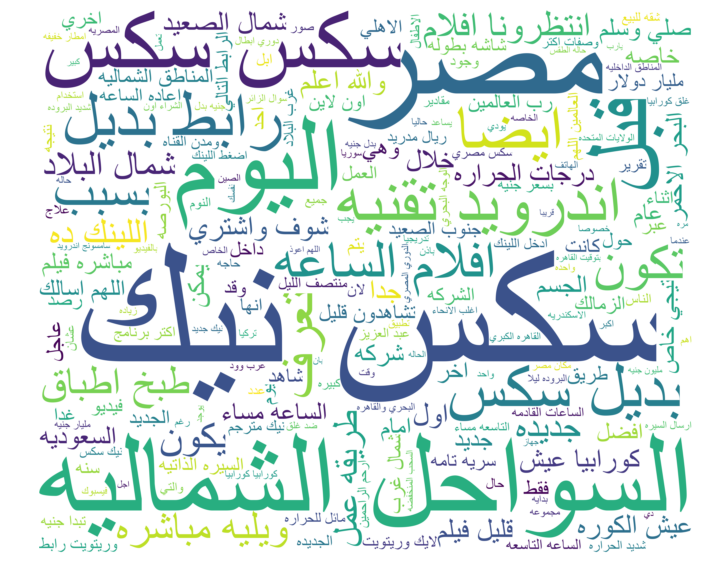

In [32]:
posts = cleandf

p_string = []
for t in posts.text:
    p_string.append(t)
p_string = pd.Series(p_string).str.cat(sep=' ')
p_string=arabic_reshaper.reshape(p_string)
p_string = get_display(p_string) # add this line
from wordcloud import WordCloud

#wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(neg_string)
WordCloud = WordCloud(font_path='arial', background_color='white',
                  mode='RGB', width=6000, height=5000).generate(p_string)
#plt.title("wordcloud")
plt.figure(figsize=(12,10))
plt.imshow(WordCloud,interpolation="bilinear")
plt.axis("off")
plt.show()

In [29]:
    #result+= 'poron tokens *' + str((porno['word_count'].sum()))
    porno=cleandf[cleandf.class1 == 'porno']

    tv  =cleandf[cleandf.class1 == 'tv']

    Politic=cleandf[cleandf.class1 == 'politic']

    tech=cleandf[cleandf.class1 == 'tech']

    ads=cleandf[cleandf.class1 == 'ads']

    food=cleandf[cleandf.class1 == 'food']

    religion=cleandf[cleandf.class1 == 'religion']

    eco=cleandf[cleandf.class1 == 'eco']

    health=cleandf[cleandf.class1 == 'health']

    sports=cleandf[cleandf.class1 == 'sport']

    weather=cleandf[cleandf.class1 == 'weather']
    
    
    
    tv1=[]
    Politic1=[]
    tech1=[]
    ads1=[]
    porno1=[]
    food1=[]
    religion1=[]
    eco1=[]
    health1=[]
    sports1=[]
    weather1=[]


    for t in porno.text:
        porno1.append(t) 

    for t1 in tv.text:
        tv1.append(t1) 
        #len(t) for t in df.text]p = []
    for t2 in Politic.text:
        Politic1.append(t2) 
        #len(t) for t in df.text]p = []
    for t3 in tech.text:
        tech1.append(t3) 
        #len(t) for t in df.text]p = []
    for t4 in ads.text:
        ads1.append(t4) 
        #len(t) for t in df.text]p = []
    for t5 in food.text:
        food1.append(t5) 
        #len(t) for t in df.text]p = []
    for t6 in religion.text:
        religion1.append(t6) 
        #len(t) for t in df.text]p = []
    for t7 in eco.text:
        eco1.append(t7) 
        #len(t) for t in df.text]p = []
    for t8 in health.text:
        health1.append(t8) 
        #len(t) for t in df.text]p = []
    for t9 in sports.text:
        sports1.append(t9) 
    for t10 in weather.text:
        weather1.append(t10) 
       

In [30]:
 c=[tv1,tech1,ads1,porno1,food1,religion1,eco1,health1,sports1,weather1]#

# Word Cloud for each class

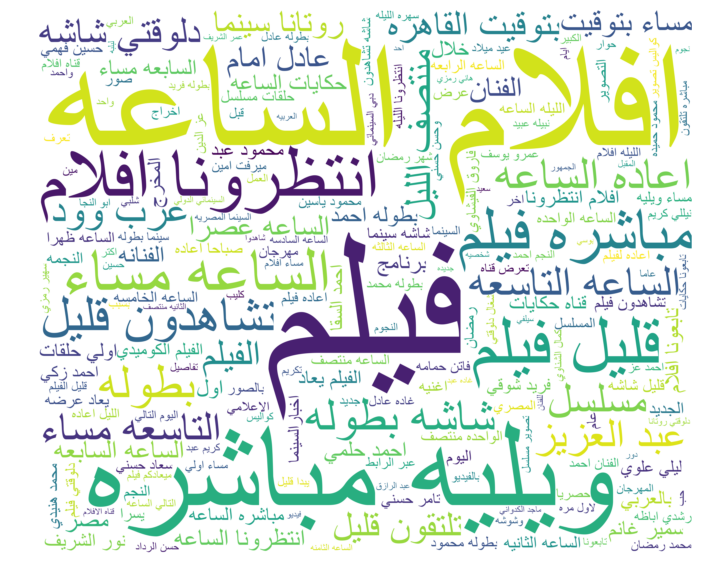

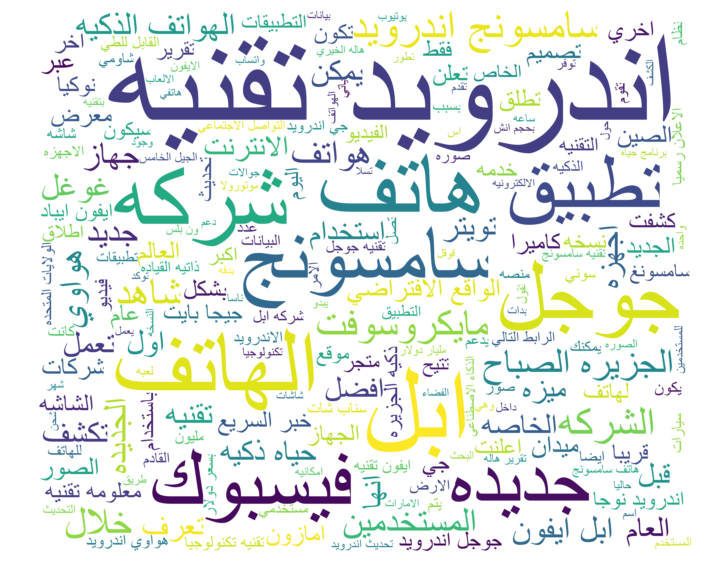

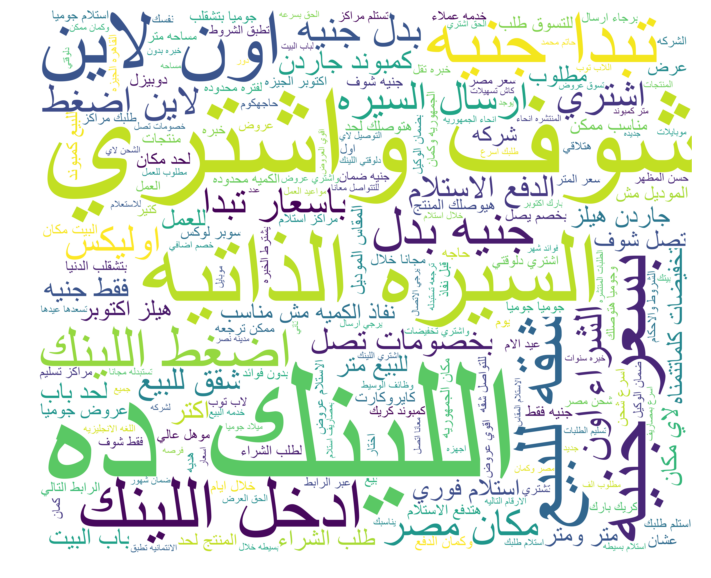

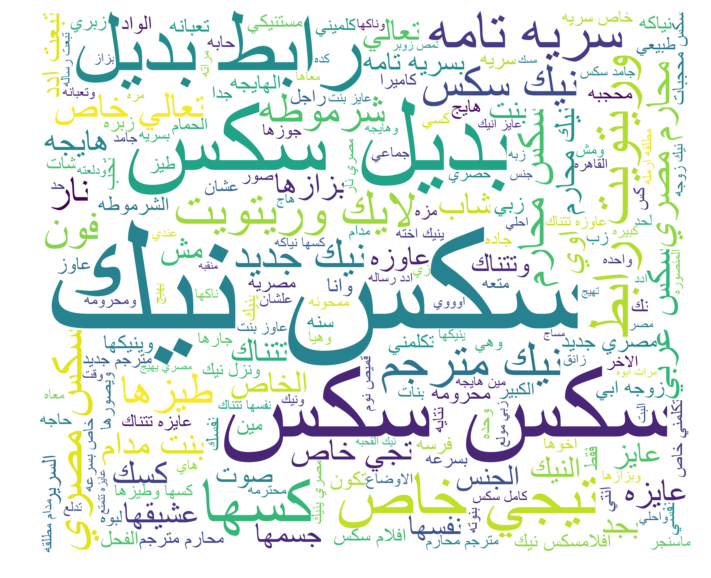

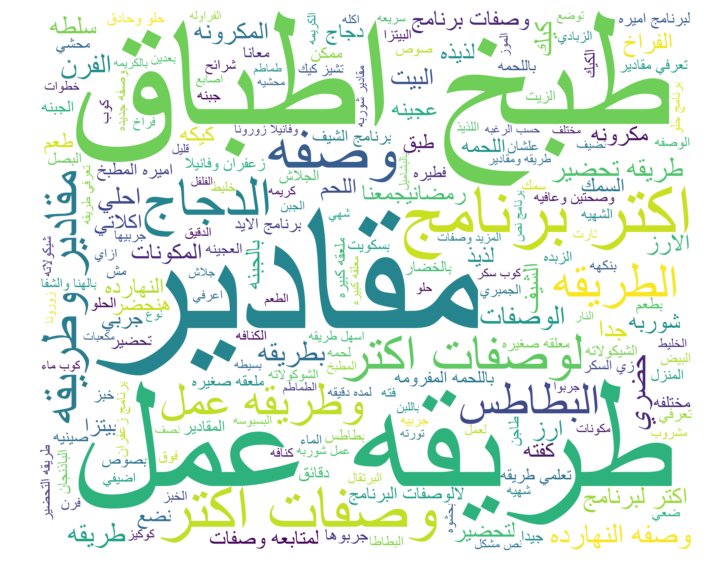

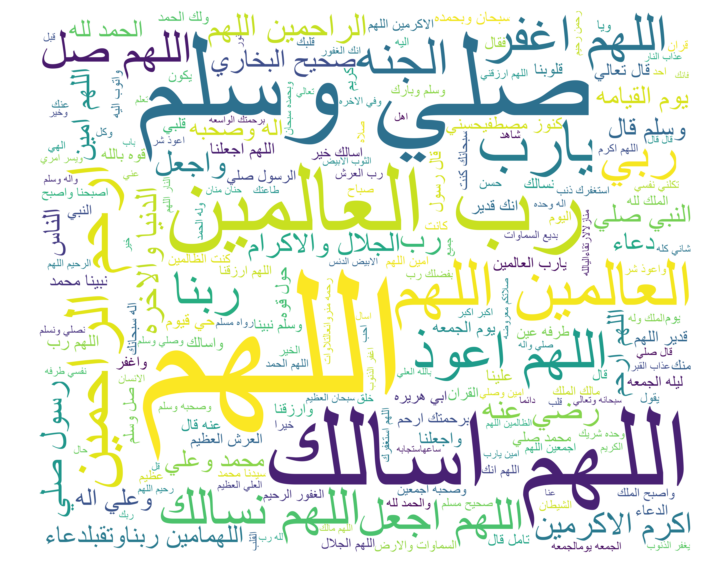

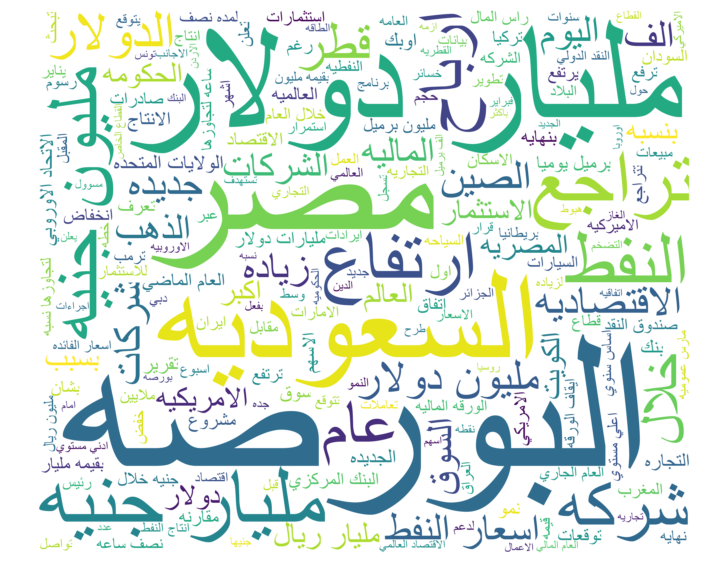

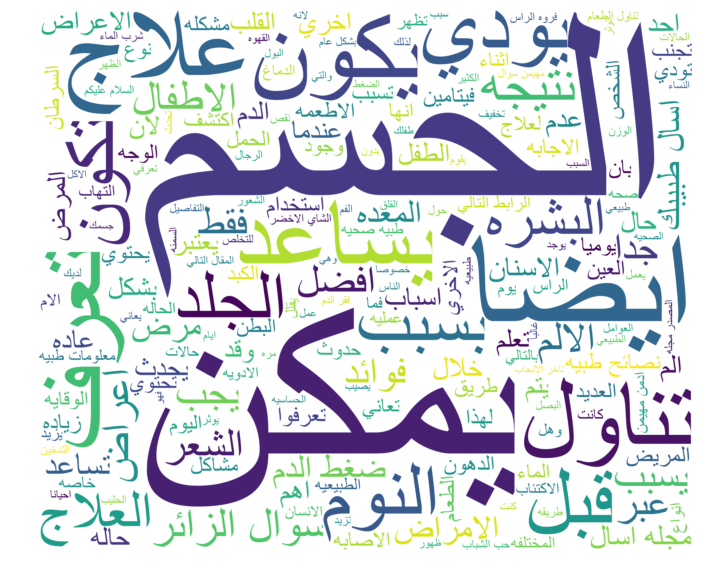

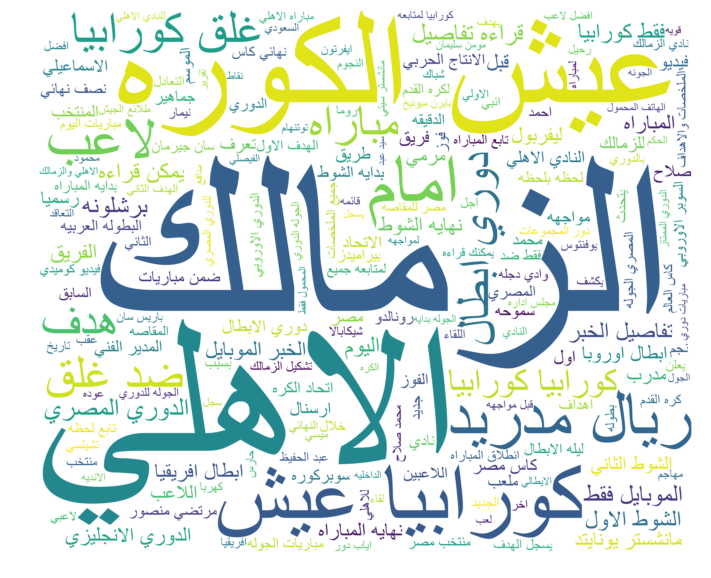

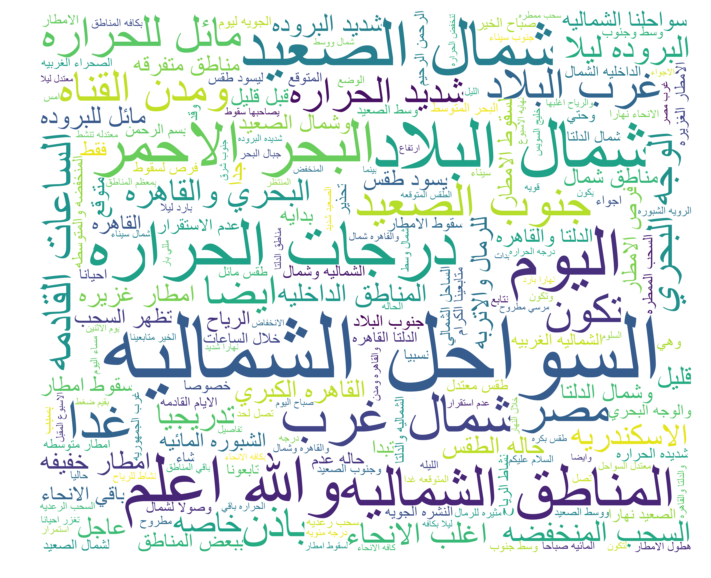

In [31]:
for p in c:   
   # p=c[0]
    p = pd.Series(p).str.cat(sep=' ')
    p=arabic_reshaper.reshape(p)
    p = get_display(p) # add this line
    from wordcloud import WordCloud

    #wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(neg_string)
    WordCloud = WordCloud(font_path='arial', background_color='white',
                      mode='RGB', width=6000, height=5000).generate(p)
    #plt.title("wordcloud")
    plt.figure(figsize=(12,10))
    plt.imshow(WordCloud,interpolation="bilinear")
    plt.axis("off")
    plt.show()